In [1]:
from pathlib import Path
import pandas as pd
import mne

In [2]:
QCR_FNAME = Path.cwd() / "IBIS-EEG-QCR-Log.csv"

def get_fpaths(sub_dir):
    """Return filepaths for the Raw, ICA, and IClables files"""
    raw_files = list(sub_dir.glob("*cleaned_raw.fif"))
    ica_files = list(sub_dir.glob("*proc-ica.fif"))
    iclabels_files = list(sub_dir.glob("*iclabels.csv"))
    assert len(raw_files) == 1, f"Expected 1 raw file, found {len(raw_files)}"
    assert len(ica_files) == 1, f"Expected 1 ICA file, found {len(ica_files)}"
    assert len(iclabels_files) == 1, f"Expected 1 IC labels file, found {len(iclabels_files)}"
    return raw_files[0], ica_files[0], iclabels_files[0]


def load_files(raw_fpath, ica_fpath, iclabels_fpath):
    """Load the raw, ICA, and IC labels files into MNE objects"""
    raw = mne.io.read_raw_fif(raw_fpath, preload=False)
    ica = mne.preprocessing.read_ica(ica_fpath)
    iclabels = pd.read_csv(iclabels_fpath)
    return raw, ica, iclabels

def load_qcr_files(sub_dir, qcr_df):
    """Load the raw, ICA, and IC labels files from a given subject directory"""
    this_file = Path(sub_dir).name
    if pd.isnull(qcr_df.loc[qcr_df["file"] == this_file, "status"]).values[0]:
        print("Loading files for ", this_file)
    else:
        print(f"{this_file} has already been processed")
    raw_fpath, ica_fpath, iclabels_fpath = get_fpaths(sub_dir)
    raw, ica, iclabels = load_files(raw_fpath, ica_fpath, iclabels_fpath)
    return raw, ica, iclabels


def get_qcr_raw(raw, ica):
    """Apply ICA to a copy of the raw data and return it"""
    raw_copy = raw.copy()
    ica.apply(raw_copy, exclude=ica.exclude)
    return raw_copy


def update_qcr(*, qcr_df, sub_dir, status, exclude, reviewer, notes):
    """Update the QCR log with the given status, reviewer, and notes"""
    this_file = Path(sub_dir).name
    qcr_df.loc[qcr_df["file"] == this_file, "status"] = status
    qcr_df.loc[qcr_df["file"] == this_file, "reviewer"] = reviewer
    qcr_df.loc[qcr_df["file"] == this_file, "notes"] = notes
    qcr_df.loc[qcr_df["file"] == this_file, "exclude"] = exclude
    qcr_df.to_csv(QCR_FNAME, index=False)
    return pd.read_csv(QCR_FNAME)


def get_ica_raw(*, ica, raw):
    ch_names = ica._ica_names
    bads = [ch_names[idx] for idx in ica.exclude]
    raw_ica = ica.get_sources(raw)
    raw_ica.info["bads"] = bads
    raw_ica.set_annotations(raw.annotations)
    return raw_ica


def apply_qcr(*, qcr_raw, raw):
    """Apply QCR to the raw data and return the updated raw data"""
    return raw.set_annotations(qcr_raw.annotations)

In [ ]:
RECOMPUTE = False

deriv_dir = Path("/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pylossless/run-01")
assert deriv_dir.exists()

sub_dirs = [sub_dir for sub_dir in deriv_dir.iterdir() if sub_dir.is_dir()]

if not QCR_FNAME.exists() or RECOMPUTE:
    filepaths = sub_dirs
    filenames = [fpath.name for fpath in filepaths]
    df = pd.DataFrame({"file" : filenames, "filepath": filepaths})
    df["status"] = pd.NA
    df["reviewer"] = pd.NA
    df["notes"] = pd.NA
    df.to_csv(QCR_FNAME, index=False)
# Load the sub_dirs from the CSV file
qcr_df = pd.read_csv(QCR_FNAME)
qcr_df

,file,filepath,status,reviewer,notes
0,PHI7002_12m_20201105_0947,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
1,PHI7011_12m_EEG_20211108_1403,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
2,PHI7011_v06_EEG_20210511_1151,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
3,PHI7012_EP_v06_20210510_1250,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
4,PHI7012_V12-CVD_EEG__20210928_1,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
...,...,...,...,...,...
98,UNC7060_v06_p2_20230818_1040,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
99,UNC7068_v06_20240312_1510,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
100,UNC_7022_v12_20221206_1731,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN
101,UNC_7041_v06_20220923_0906,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN


In [47]:
sub_dir_gen = (sub_dir for sub_dir in sub_dirs)

In [90]:
raw, ica, ic_labels = load_qcr_files(next(sub_dir_gen), qcr_df)

Loading files for  PHI7011_12m_EEG_20211108_1403
Opening raw data file /Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pylossless/run-01/PHI7011_12m_EEG_20211108_1403/PHI7011_12m_EEG_20211108_1403_proc-cleaned_raw.fif...
    Reading extended channel information
    Range : 0 ... 981894 =      0.000 ...   981.894 secs
Ready.
Reading /Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pylossless/run-01/PHI7011_12m_EEG_20211108_1403/PHI7011_12m_EEG_20211108_1403_proc-ica.fif ...
    Reading extended channel information
Now restoring ICA solution ...
Ready.


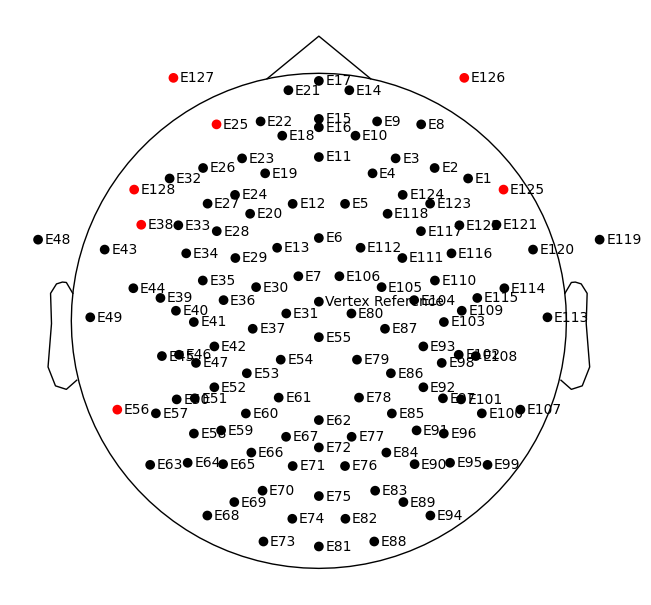

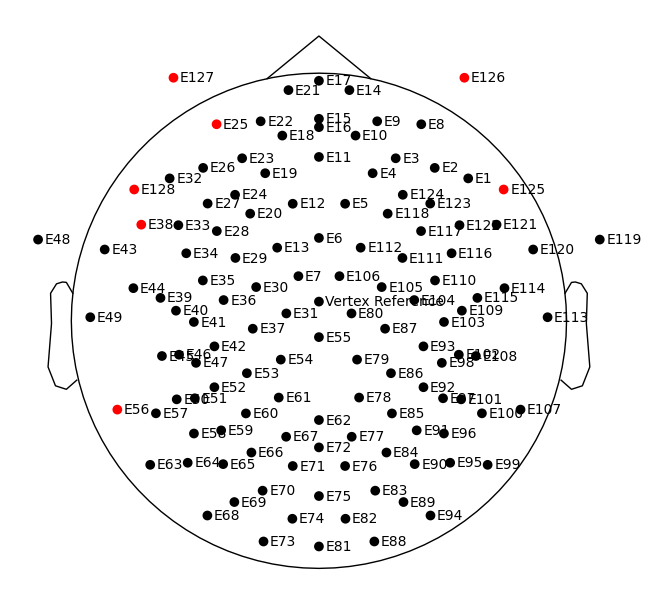

In [94]:
raw.plot_sensors(show_names=True)

In [99]:
raw.plot(theme="light")

qt.core.qobject.connect: QObject::connect(QStyleHints, QStyleHints): unique connections require a pointer to member function of a QObject subclass


Using pyopengl with version 3.1.9


<mne_qt_browser._pg_figure.MNEQtBrowser(0x7f999803c3f0) at 0x14271e640>

Channels marked as bad:
['E125', 'E126', 'E127', 'E128', 'E25', 'E38', 'E56']


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne_qt_browser/_pg_figure.py:3061: RuntimeWarning: Failed to disconnect (None) from signal "triggered()".
  sig.disconnect()


Setting 147083 of 981895 (14.98%) samples to NaN, retaining 834812 (85.02%) samples.
Effective window size : 2.048 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 106, using nperseg = 106
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 364, using nperseg = 364
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserW

Plotting power spectral density (dB=True).


/var/folders/z1/jw4bwv7s13b66b4cz2_m6pzw0000gn/T/ipykernel_86343/468738619.py:1: UserWarning: Infinite value in PSD for channel Vertex Reference.
These channels might be dead.
  raw.compute_psd(fmin=1, fmax=100, method="welch").plot()
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


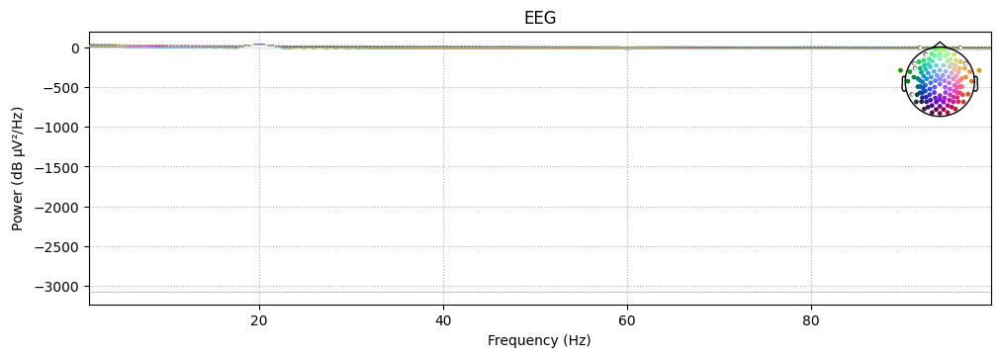

In [100]:
raw.compute_psd(fmin=1, fmax=100, method="welch").plot()

In [ ]:
cleaned_raw = ica.apply(raw.copy().load_data(), exclude=ica.exclude)

In [104]:
cleaned_raw.plot(theme="light")

qt.core.qobject.connect: QObject::connect(QStyleHints, QStyleHints): unique connections require a pointer to member function of a QObject subclass


Using pyopengl with version 3.1.9


<mne_qt_browser._pg_figure.MNEQtBrowser(0x7f9c1946eae0) at 0x153c00280>

Channels marked as bad:
['E125', 'E126', 'E127', 'E128', 'E25', 'E38', 'E56', np.str_('E12'), np.str_('E17'), np.str_('E9'), np.str_('E3'), np.str_('E14'), np.str_('E88'), np.str_('E81'), np.str_('E99')]


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne_qt_browser/_pg_figure.py:3061: RuntimeWarning: Failed to disconnect (None) from signal "triggered()".
  sig.disconnect()


Setting 221698 of 981895 (22.58%) samples to NaN, retaining 760197 (77.42%) samples.
Effective window size : 2.048 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 106, using nperseg = 106
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 364, using nperseg = 364
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserW

Plotting power spectral density (dB=True).


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 188, using nperseg = 188
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 82, using nperseg = 82
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1003, using nperseg = 1003
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1001, using nperseg = 1001
  return _func(*args, **kwargs)
/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne/time_frequency/psd.py:

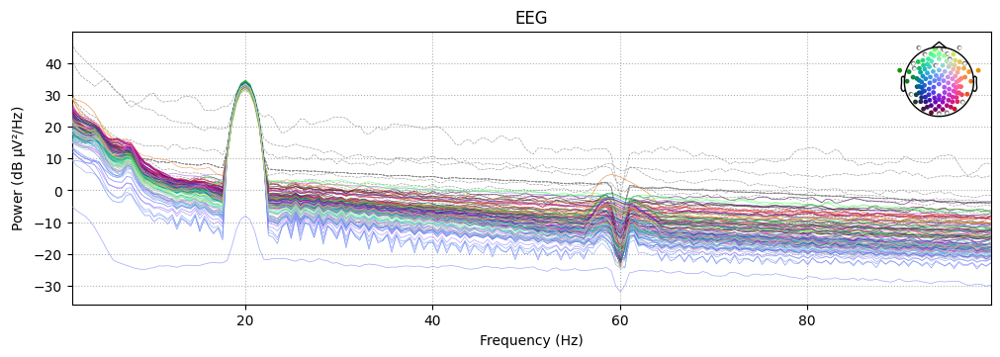

In [105]:
cleaned_raw.compute_psd(fmin=1, fmax=100, method="welch").plot()

In [91]:
raw_ica = get_ica_raw(ica=ica, raw=raw)
raw_ica

<Raw | 115 x 981895 (981.9 s), ~861.6 MiB, data loaded>

In [ ]:
raw_ica.plot(theme="light")

qt.core.qobject.connect: QObject::connect(QStyleHints, QStyleHints): unique connections require a pointer to member function of a QObject subclass


Using pyopengl with version 3.1.9


<mne_qt_browser._pg_figure.MNEQtBrowser(0x7f9925fa3300) at 0x14c6a2d00>

Channels marked as bad:
['ICA007', 'ICA023', 'ICA029', 'ICA054', 'ICA055', 'ICA081', 'ICA082', 'ICA085', 'ICA105']


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne_qt_browser/_pg_figure.py:3061: RuntimeWarning: Failed to disconnect (None) from signal "triggered()".
  sig.disconnect()


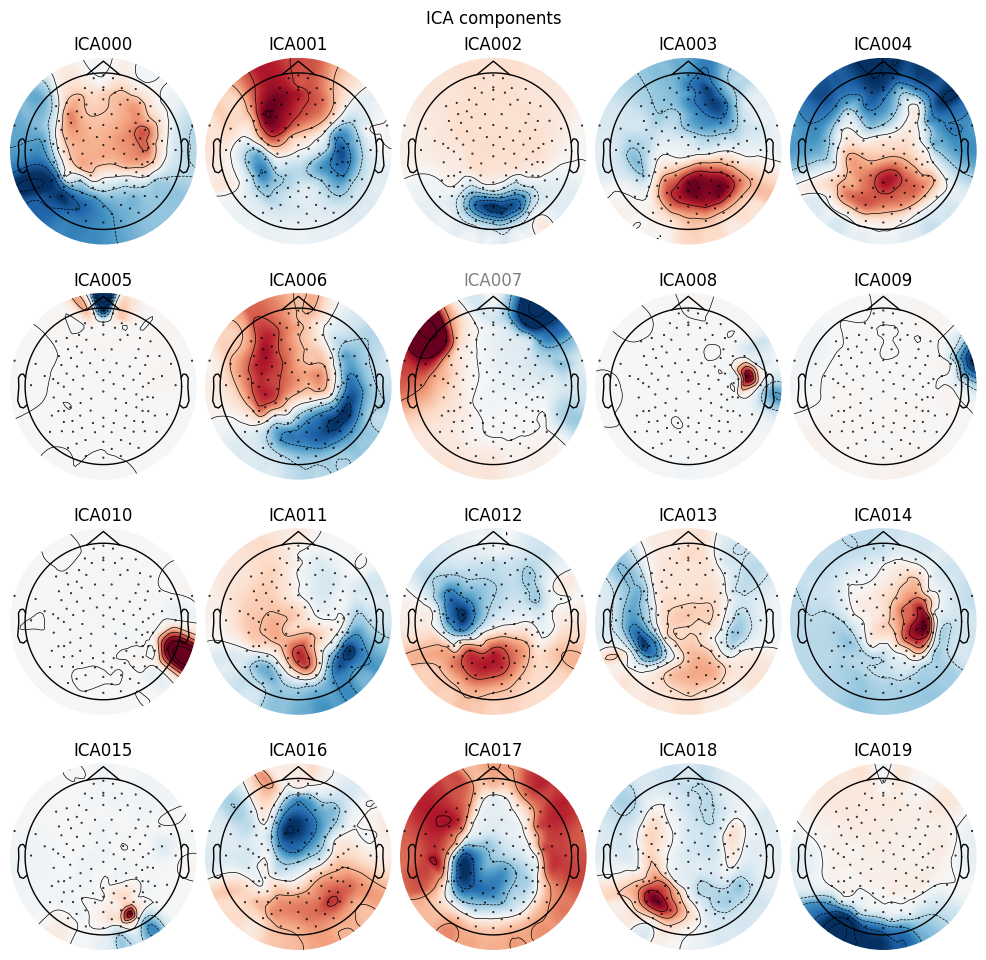

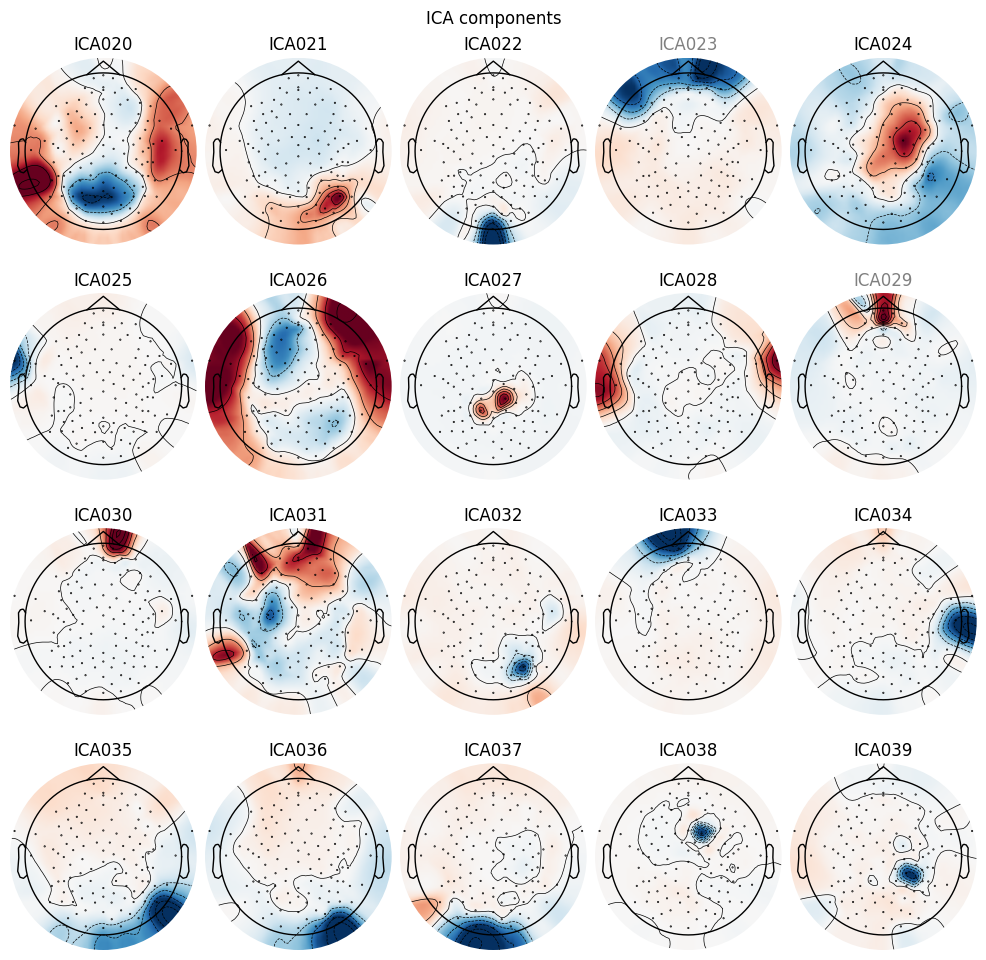

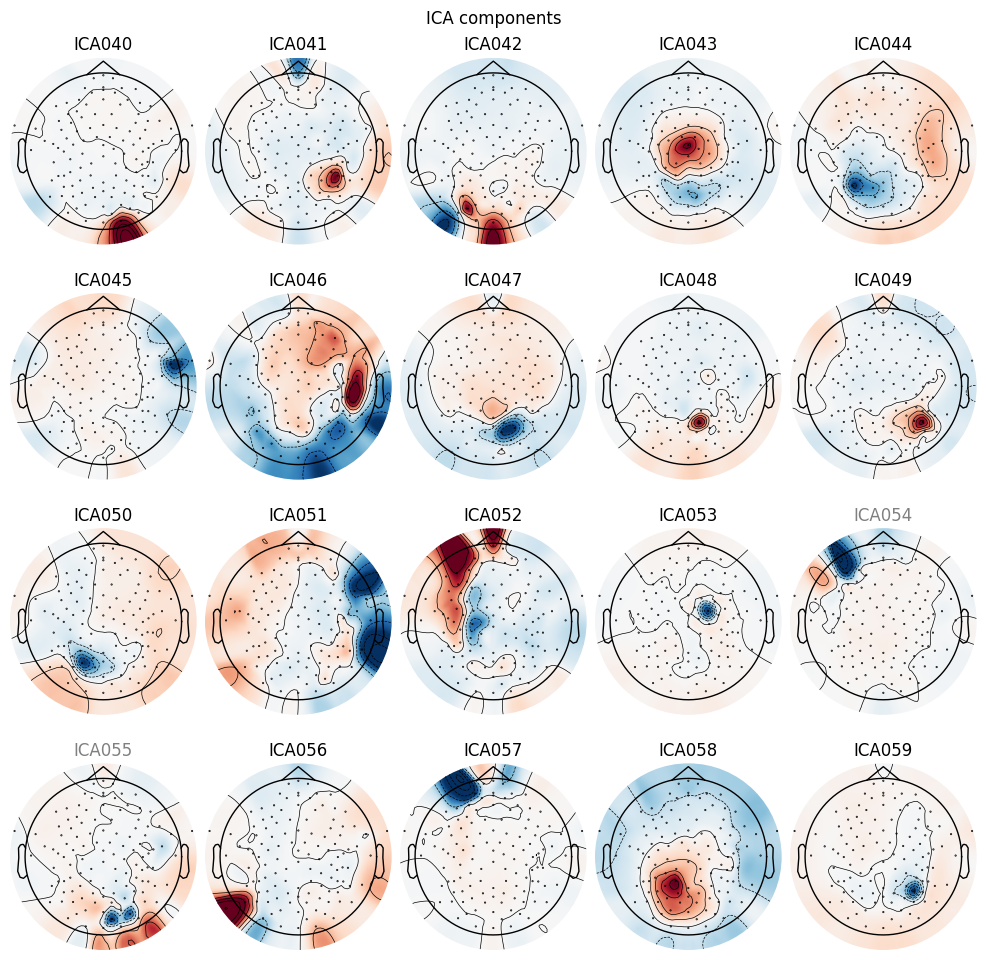

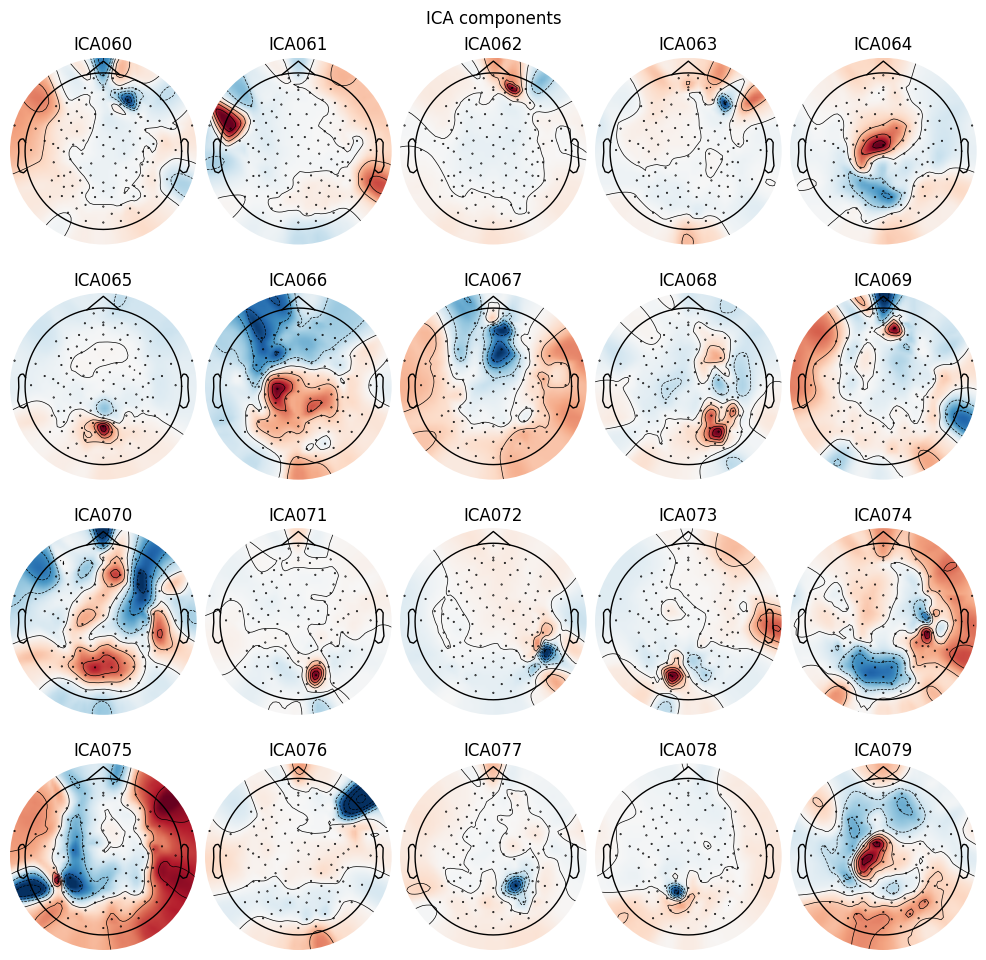

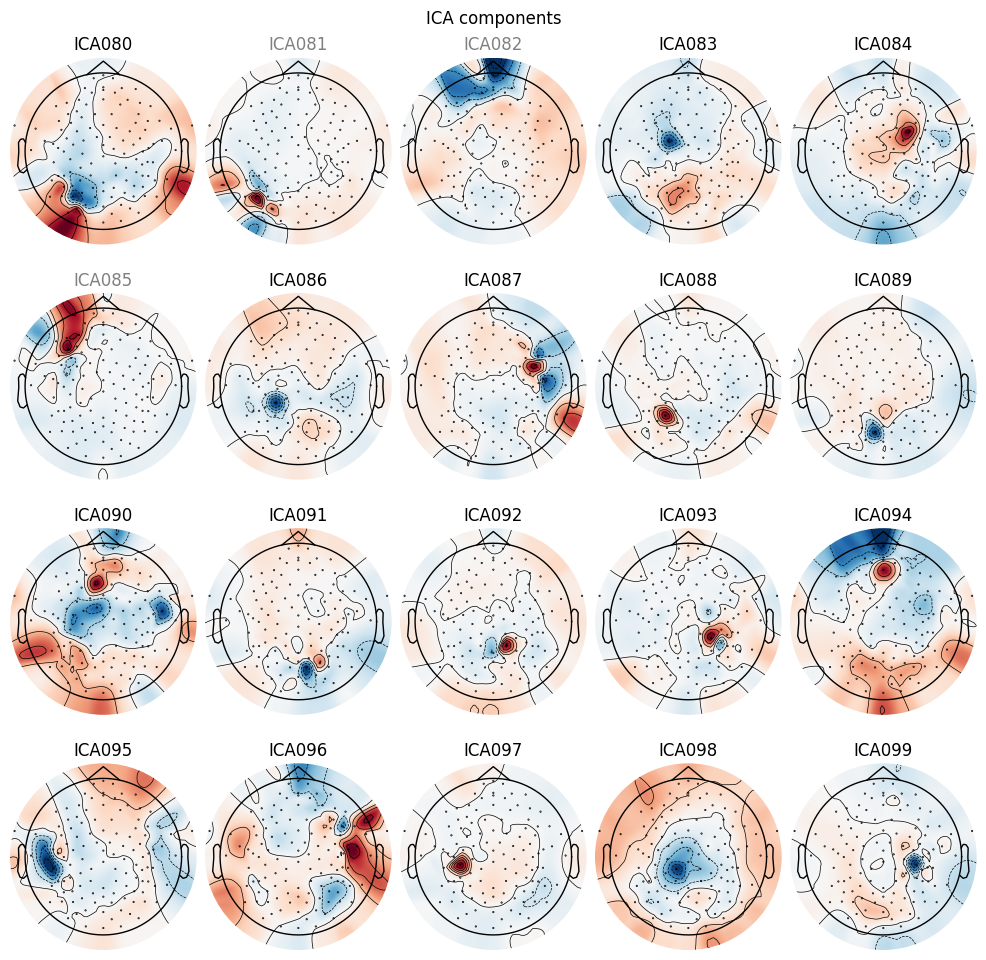

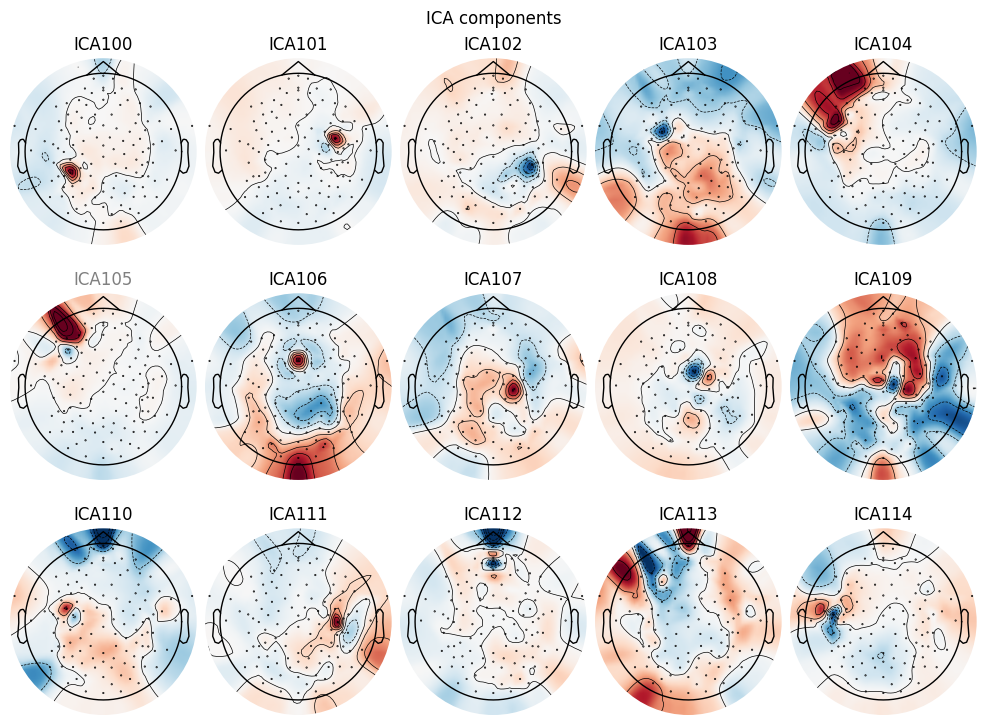

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x731.5 with 15 Axes>]

In [96]:
ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
253 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
253 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
253 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
253 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
253 matching events found
No baseline correction applied
0 projection items activated


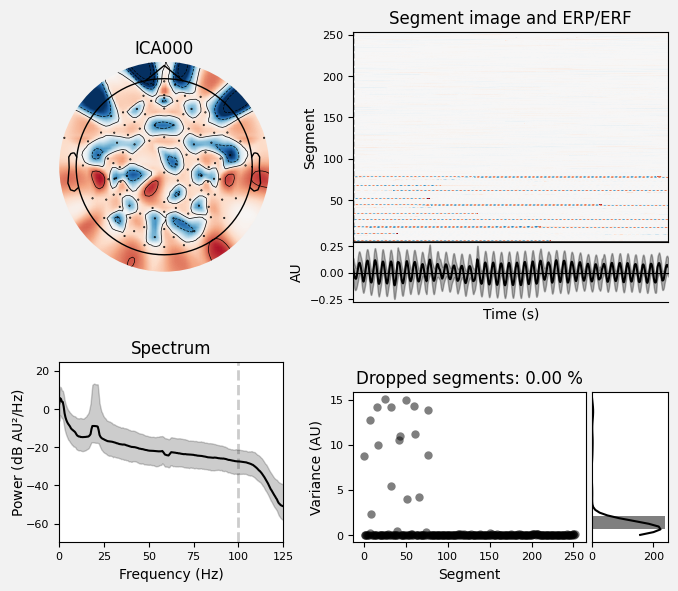

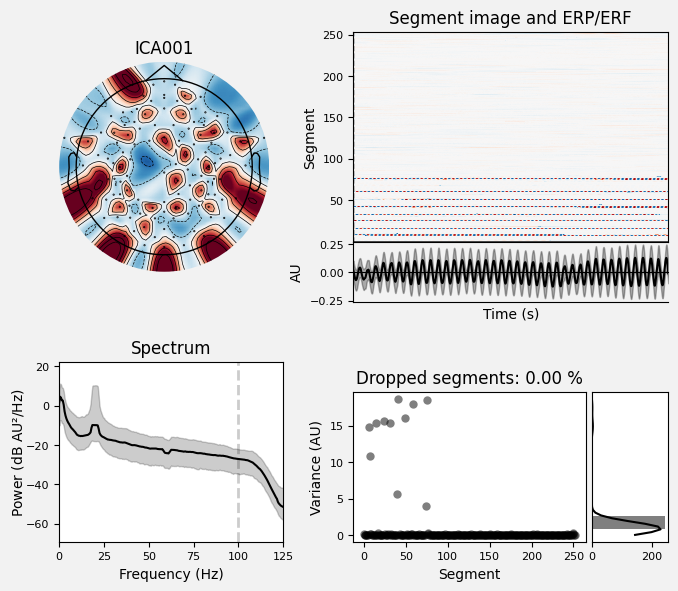

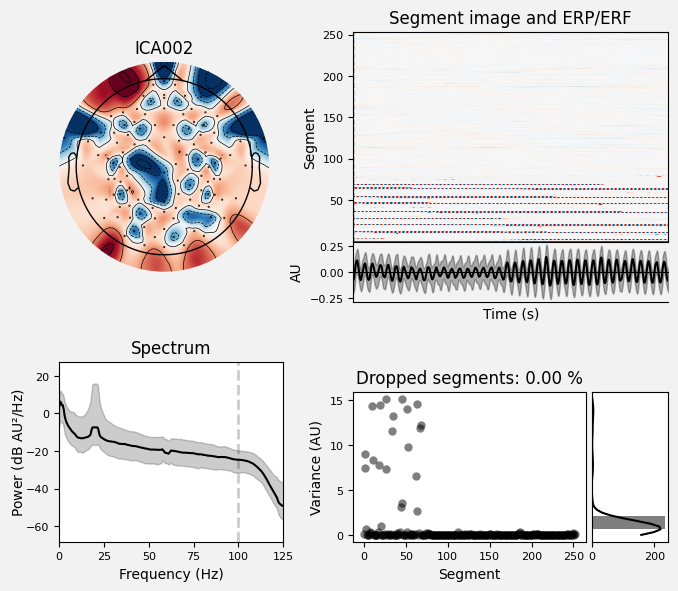

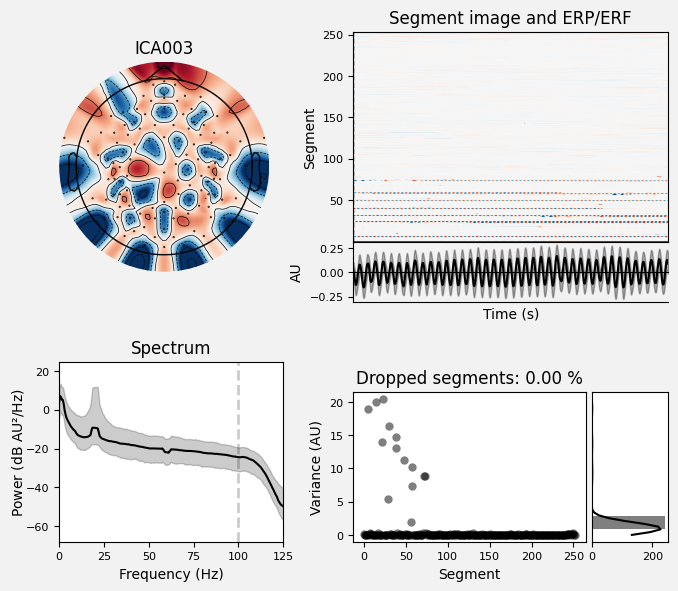

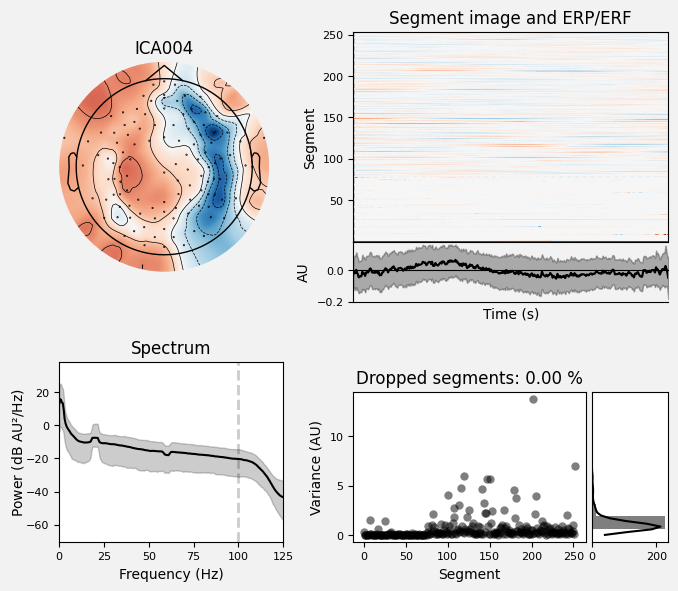

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [80]:
ica.plot_properties(inst=raw)

In [82]:
raw.plot(theme="light")

qt.core.qobject.connect: QObject::connect(QStyleHints, QStyleHints): unique connections require a pointer to member function of a QObject subclass


Using pyopengl with version 3.1.9


<mne_qt_browser._pg_figure.MNEQtBrowser(0x7f9c6e3e3860) at 0x139f8c7c0>

Channels marked as bad:
['E125', 'E126', 'E127', 'E128', 'Vertex Reference', 'E90', 'E83', 'E25', np.str_('E16'), np.str_('E15'), np.str_('E17'), np.str_('E14'), np.str_('E22'), np.str_('E21'), np.str_('E65'), np.str_('E64')]


/Users/scotterik/devel/projects/IBIS-EEG/.venv/lib/python3.10/site-packages/mne_qt_browser/_pg_figure.py:3061: RuntimeWarning: Failed to disconnect (None) from signal "triggered()".
  sig.disconnect()


In [83]:
new_ica = mne.preprocessing.ica.ICA(
    method="picard",
    fit_params={"extended": True, "ortho": False}
)
new_ica.fit(raw)

Fitting ICA to data using 113 channels (please be patient, this may take a while)
Omitting 472555 of 815548 (57.94%) samples, retaining 342993 (42.06%) samples.
Selecting by non-zero PCA components: 113 components
Fitting ICA took 395.6s.


Method,picard
Fit parameters,extended=Trueortho=Falsemax_iter=500
Fit,156 iterations on raw data (342993 samples)
ICA components,113
Available PCA components,113
Channel types,eeg
ICA components marked for exclusion,—


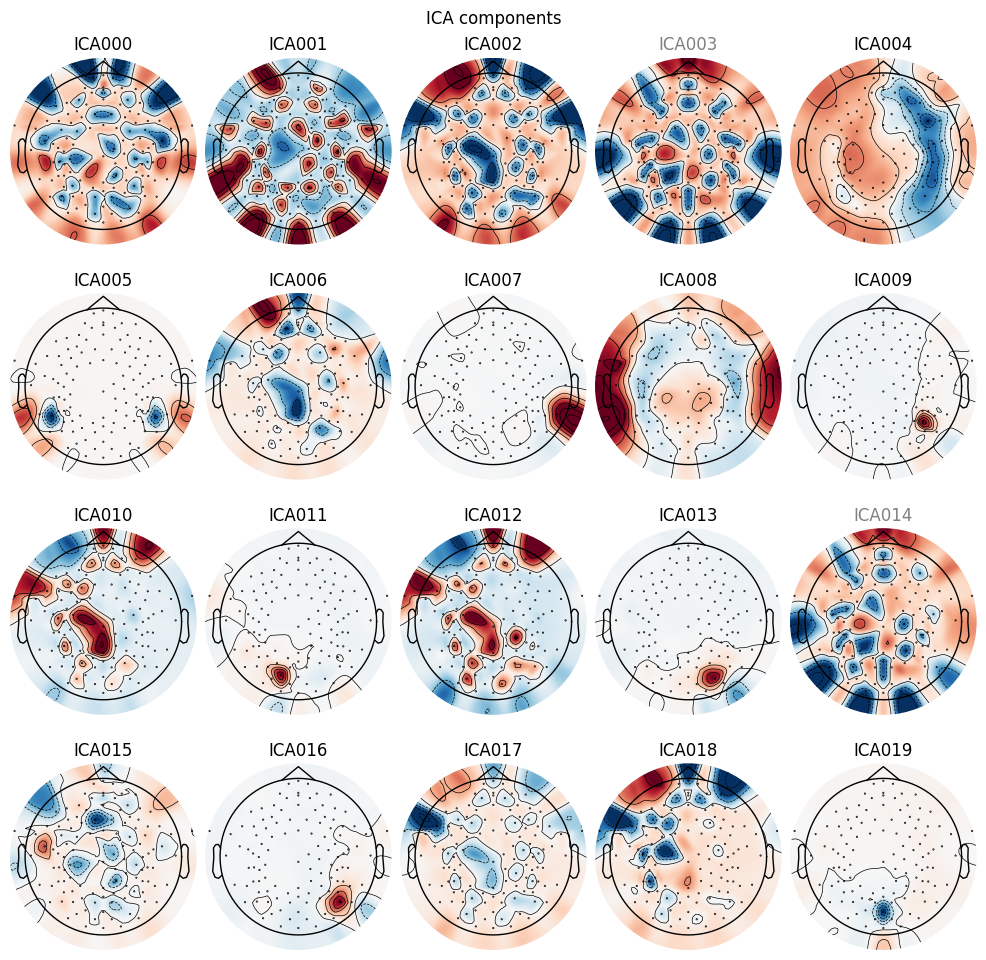

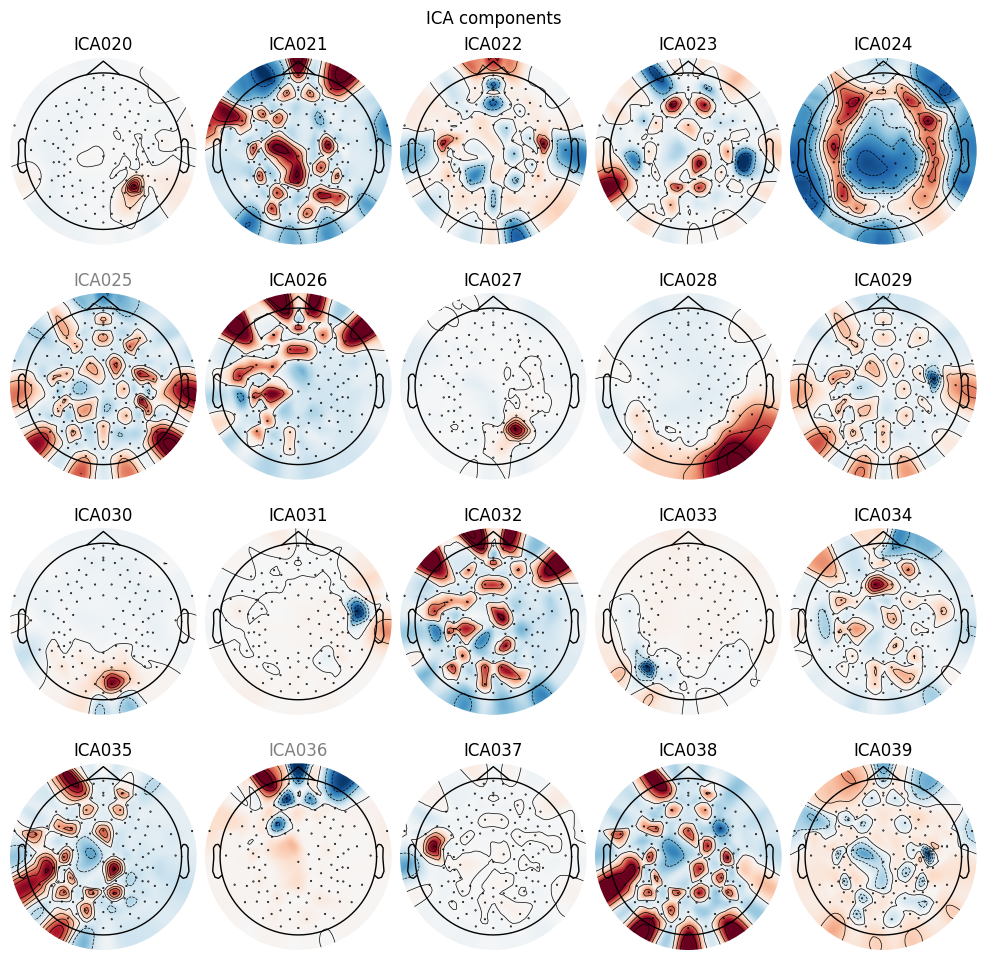

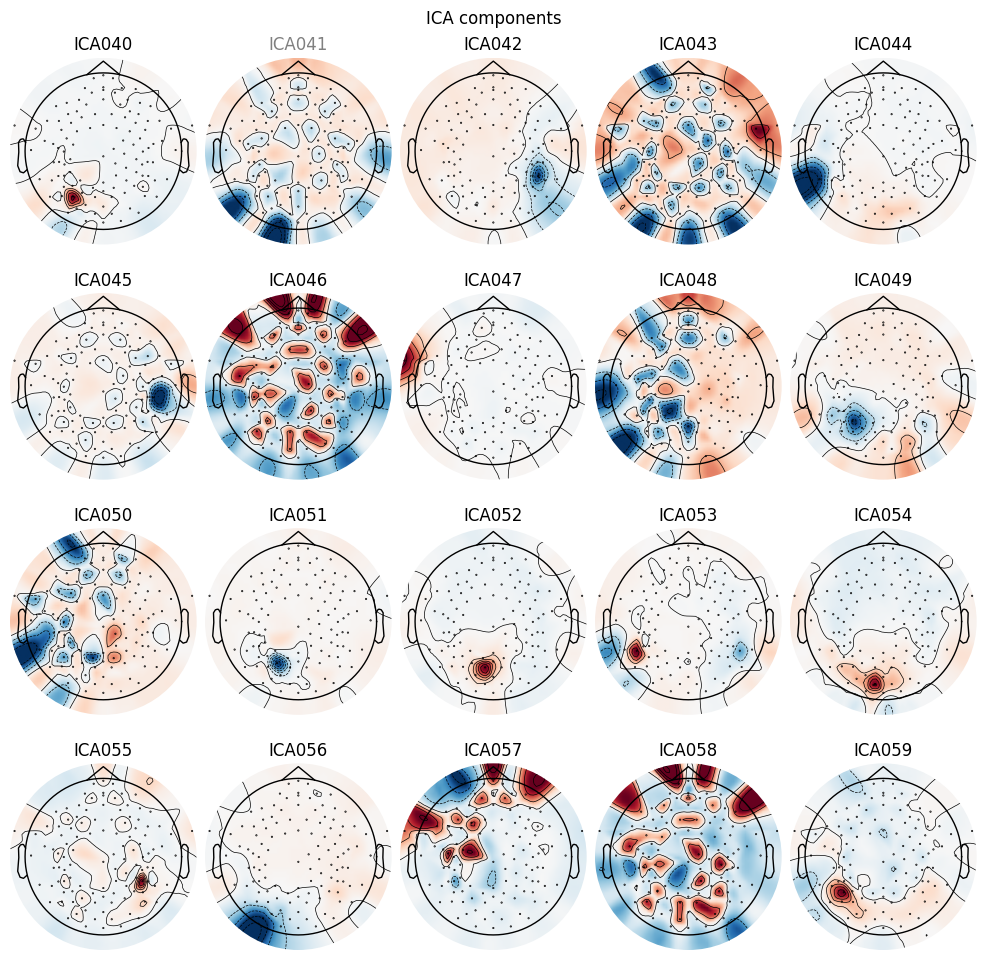

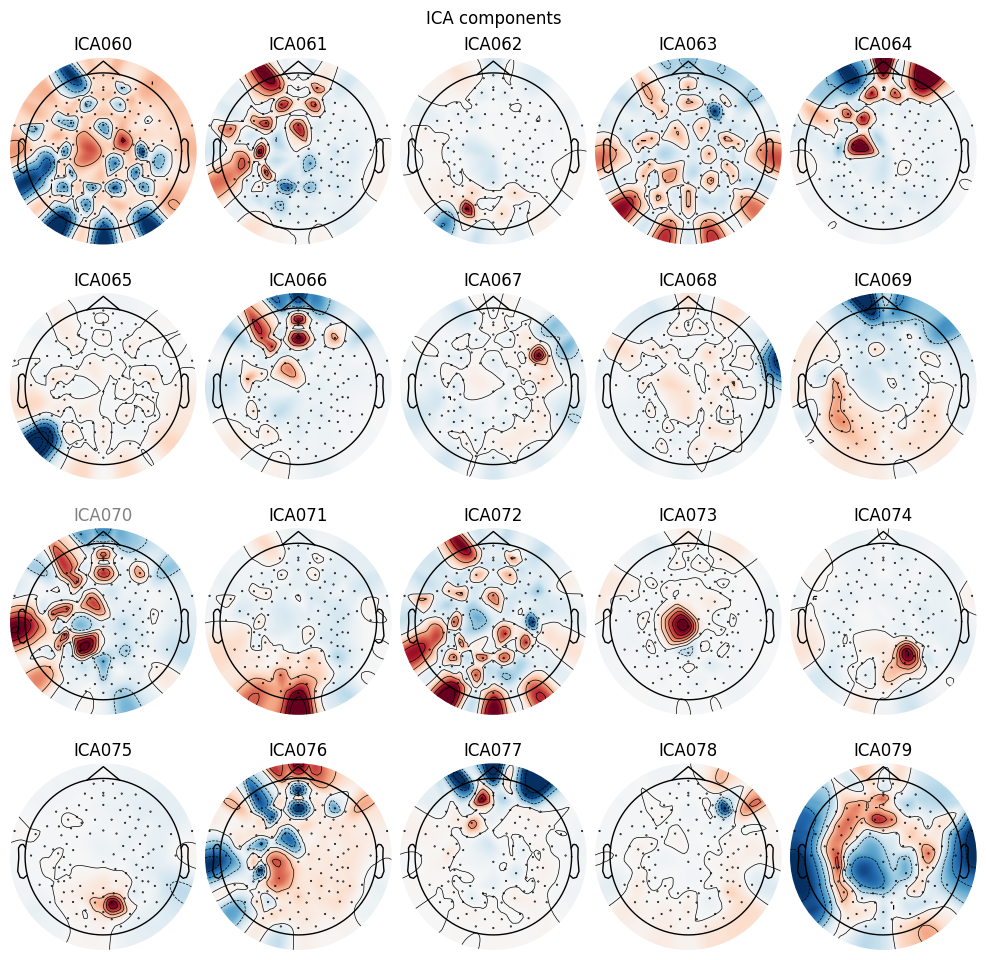

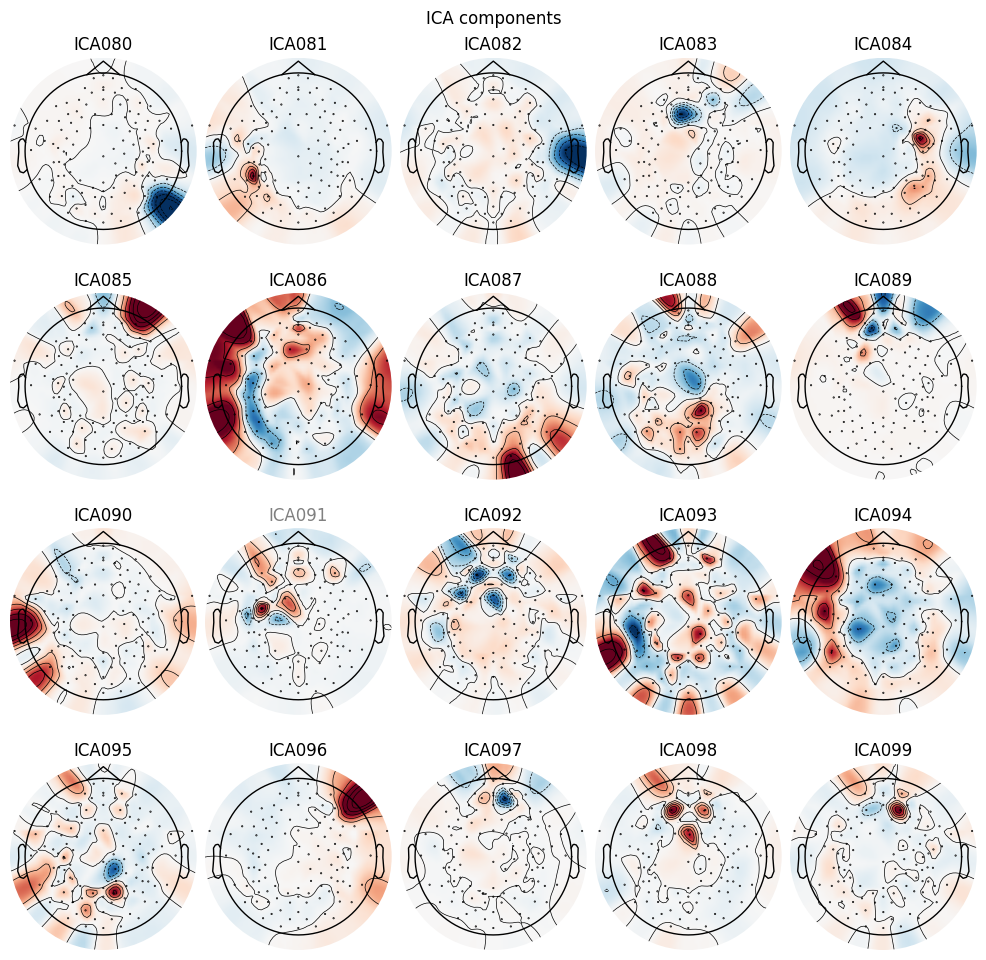

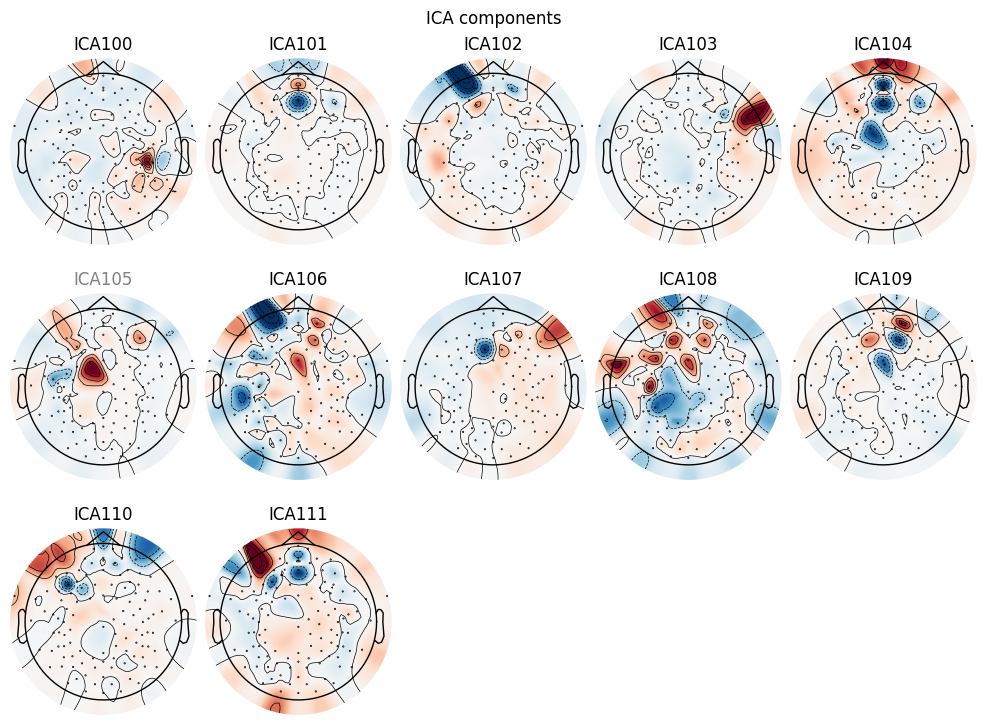

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x731.5 with 12 Axes>]

In [84]:
ica.plot_components()

In [89]:
qcr_df = update_qcr(
    qcr_df=qcr_df,
    sub_dir=raw.filenames[0].parent.name,
    status="Done",
    exclude=True,
    reviewer="Scott",
    notes="Terrible data and bad ICA decomposition."
)
qcr_df

,file,filepath,status,reviewer,notes,exclude
0,PHI7002_12m_20201105_0947,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,Done,Scott,Terrible data and bad ICA decomposition.,True
1,PHI7011_12m_EEG_20211108_1403,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
2,PHI7011_v06_EEG_20210511_1151,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
3,PHI7012_EP_v06_20210510_1250,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
4,PHI7012_V12-CVD_EEG__20210928_1,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
98,UNC7060_v06_p2_20230818_1040,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
99,UNC7068_v06_20240312_1510,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
100,UNC_7022_v12_20221206_1731,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN
101,UNC_7041_v06_20220923_0906,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,NaN,NaN,NaN,NaN


In [88]:
df

,file,filepath,status,reviewer,notes
0,PHI7002_12m_20201105_0947,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
1,PHI7011_12m_EEG_20211108_1403,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
2,PHI7011_v06_EEG_20210511_1151,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
3,PHI7012_EP_v06_20210510_1250,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
4,PHI7012_V12-CVD_EEG__20210928_1,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
...,...,...,...,...,...
98,UNC7060_v06_p2_20230818_1040,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
99,UNC7068_v06_20240312_1510,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
100,UNC_7022_v12_20221206_1731,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
101,UNC_7041_v06_20220923_0906,/Volumes/UBUNTU18/USC/IBIS-EEG/derivatives/pyl...,<NA>,<NA>,<NA>
